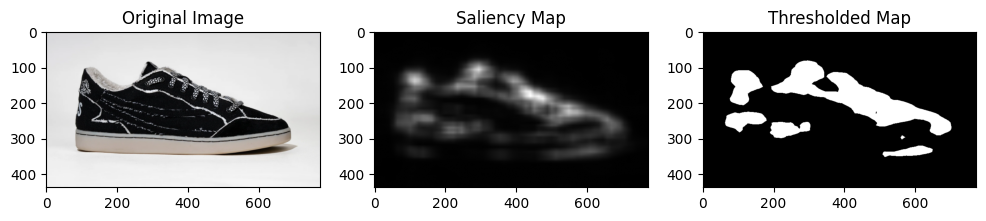

In [ ]:
import cv2
import numpy as np
import imutils
import matplotlib.pyplot as plt
image = cv2.imread('/content/car.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
saliency = cv2.saliency.StaticSaliencySpectralResidual_create()
(success, saliency_map) = saliency.computeSaliency(image)
saliency_map = (saliency_map * 255).astype("uint8")
thresh_map = cv2.threshold(saliency_map, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(image)
plt.subplot(1, 3, 2)
plt.title("Saliency Map")
plt.imshow(saliency_map, cmap="gray")
plt.subplot(1, 3, 3)
plt.title("Thresholded Map")
plt.imshow(thresh_map, cmap="gray")
plt.show()

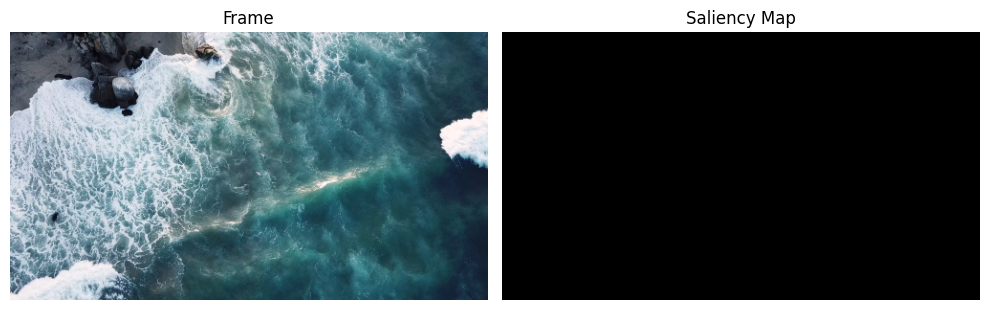

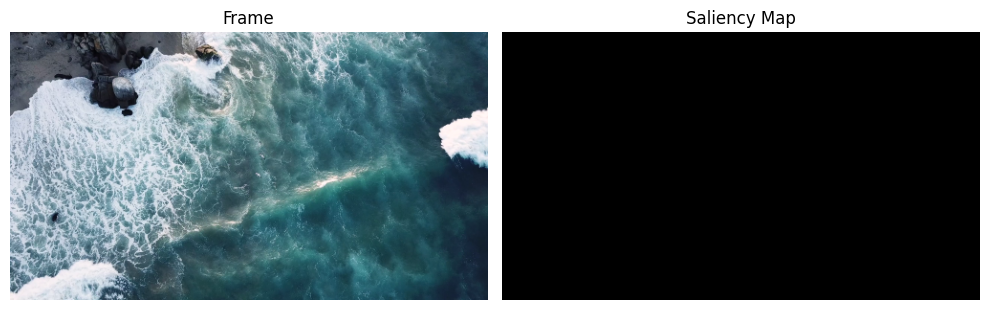

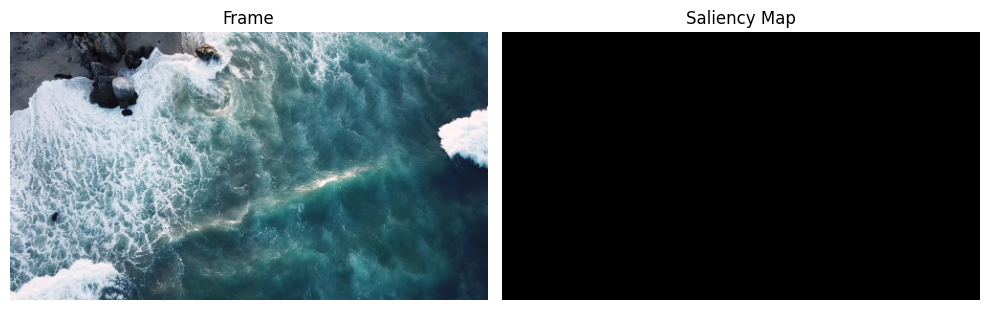

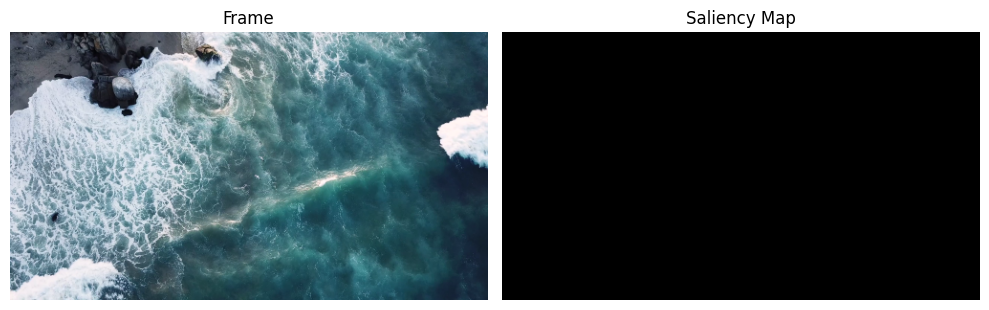

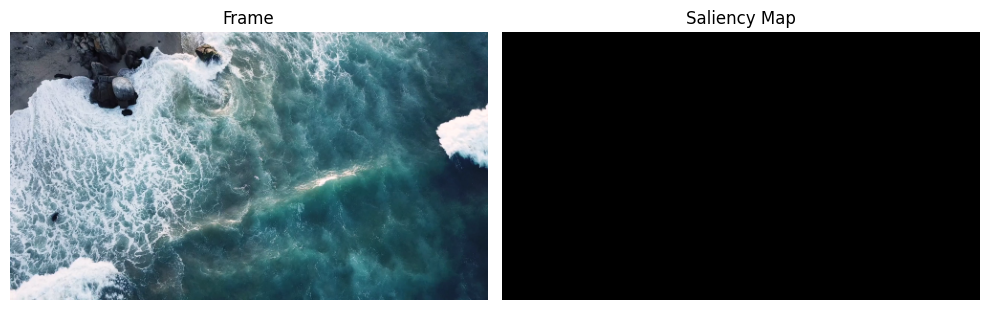

...

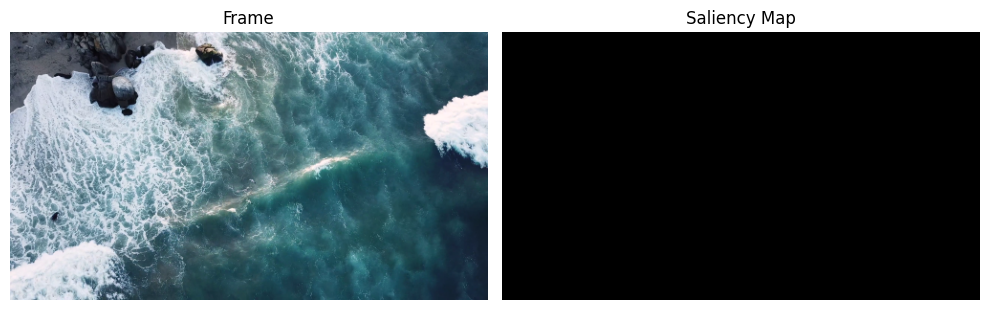

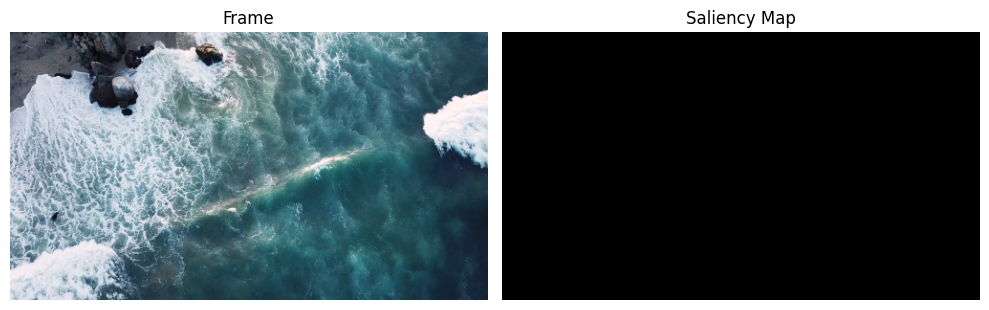

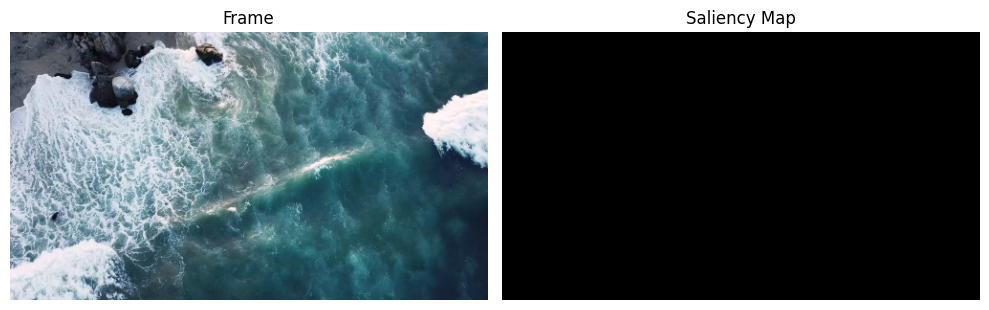

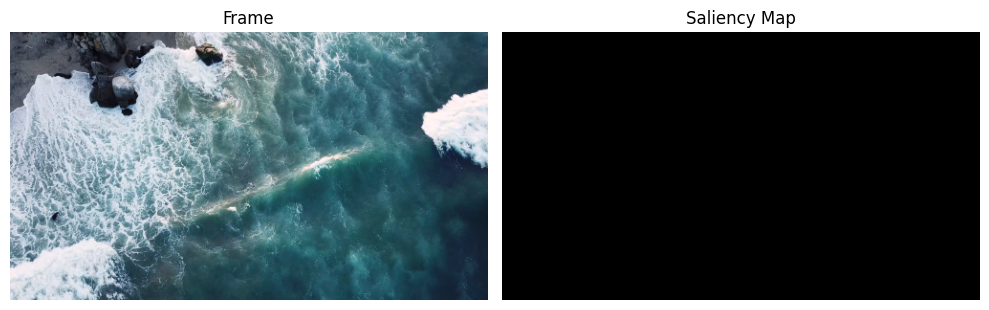

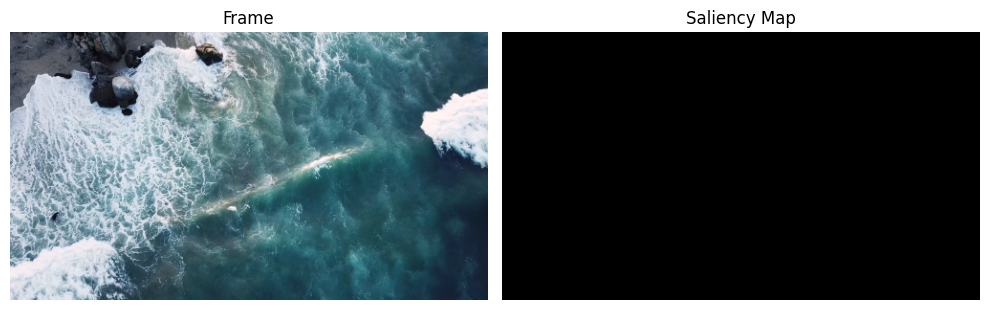

In [ ]:
cap = cv2.VideoCapture('/content/nature.mp4')
saliency = None
def show_frame(frame, saliency_map):
    fig, axs = plt.subplots(1, 2, figsize=(10, 4))
    axs[0].imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    axs[0].set_title("Frame")
    axs[0].axis("off")

    axs[1].imshow(saliency_map, cmap='gray')
    axs[1].set_title("Saliency Map")
    axs[1].axis("off")

    plt.tight_layout()
    plt.show()
frame_limit = 30
frame_count = 0
while frame_count < frame_limit:
    ret, frame = cap.read()
    if not ret:
        break
    frame = imutils.resize(frame, width=500)
    if saliency is None:
        saliency = cv2.saliency.MotionSaliencyBinWangApr2014_create()
        saliency.setImagesize(frame.shape[1], frame.shape[0])
        saliency.init()
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    (success, saliencyMap) = saliency.computeSaliency(gray)
    saliencyMap = (saliencyMap * 255).astype("uint8")
    show_frame(frame, saliencyMap)
    frame_count += 1
cap.release()


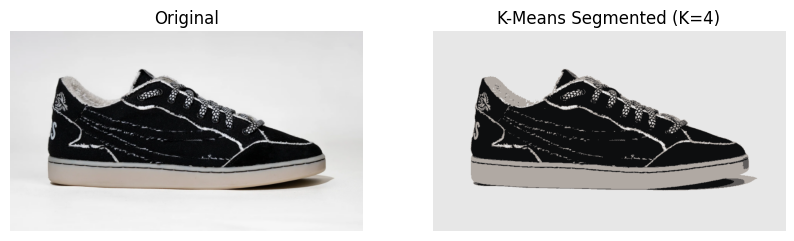

In [ ]:
image = cv2.imread('car.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
Z = image.reshape((-1, 3))
Z = np.float32(Z)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
K = 4  # number of segments
_, labels, centers = cv2.kmeans(Z, K, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
centers = np.uint8(centers)
segmented_image = centers[labels.flatten()]
segmented_image = segmented_image.reshape((image.shape))
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Original')
plt.imshow(image)
plt.axis('off')
plt.subplot(1, 2, 2)
plt.title('K-Means Segmented (K=4)')
plt.imshow(segmented_image)
plt.axis('off')
plt.show()

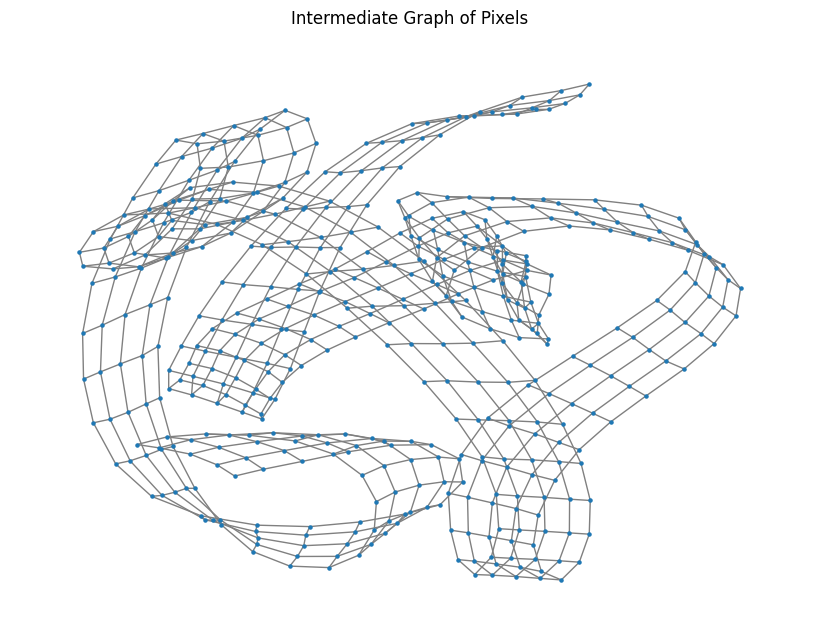

In [ ]:
import networkx as nx
img = cv2.imread('car.png')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
gray = cv2.resize(gray, (100, 100))
rows, cols = gray.shape
G = nx.Graph()
for i in range(rows):
    for j in range(cols):
        node = i * cols + j
        G.add_node(node, intensity=int(gray[i, j]))

        # Connect to right and bottom neighbors
        if j + 1 < cols:
            right = i * cols + (j + 1)
            weight = np.exp(-abs(int(gray[i, j]) - int(gray[i, j + 1])) / 10)
            G.add_edge(node, right, weight=weight)
        if i + 1 < rows:
            down = (i + 1) * cols + j
            weight = np.exp(-abs(int(gray[i, j]) - int(gray[i + 1, j])) / 10)
            G.add_edge(node, down, weight=weight)
sub_nodes = list(G.nodes())[:500]
subG = G.subgraph(sub_nodes)
plt.figure(figsize=(8, 6))
pos = nx.spring_layout(subG, seed=42)
nx.draw(subG, pos, node_size=5, with_labels=False, edge_color='gray')
plt.title("Intermediate Graph of Pixels")
plt.show()

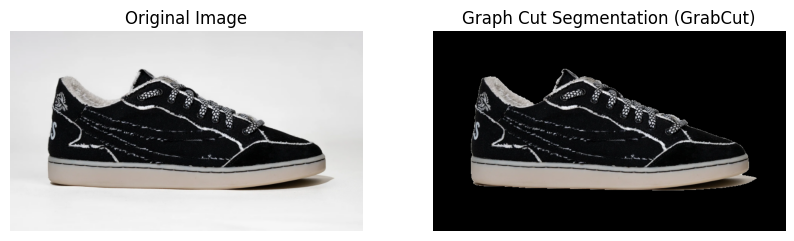

In [ ]:
mask = np.zeros(img.shape[:2], np.uint8)
bgdModel = np.zeros((1, 65), np.float64)
fgdModel = np.zeros((1, 65), np.float64)

rect = (50, 50, img.shape[1] - 100, img.shape[0] - 100)
cv2.grabCut(img, mask, rect, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_RECT)

mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')
result = img * mask2[:, :, np.newaxis]

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.subplot(1, 2, 2)
plt.title("Graph Cut Segmentation (GrabCut)")
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()